In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from scipy.stats import rankdata
import random
from SpaLP.utils import prepare_inputs
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    # 设置绘图风格
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae

In [2]:
set_seed(7)

================================== pattern:pattern7  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.5509 (Higher is better)    | 0.3352
SPCC       | 0.3300 (Higher is better)    | 0.2474
RMSE       | 0.3643 (Lower is better)     | 0.4144
MAE        | 0.3450 (Lower is better)     | 0.3905


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern8  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.4197 (Higher is better)    | 0.2487
SPCC       | 0.1627 (Higher is better)    | 0.1651
RMSE       | 0.3814 (Lower is better)     | 0.4375
MAE        | 0.3647 (Lower is better)     | 0.4181


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern4  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.5981 (Higher is better)    | 0.3719
SPCC       | 0.4257 (Higher is better)    | 0.2935
RMSE       | 0.3645 (Lower is better)     | 0.4037
MAE        | 0.3439 (Lower is better)     | 0.3766


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern2  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.5503 (Higher is better)    | 0.3364
SPCC       | 0.3322 (Higher is better)    | 0.2485
RMSE       | 0.3706 (Lower is better)     | 0.4161
MAE        | 0.3515 (Lower is better)     | 0.3923


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern5  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.5587 (Higher is better)    | 0.3346
SPCC       | 0.3321 (Higher is better)    | 0.2459
RMSE       | 0.3714 (Lower is better)     | 0.4168
MAE        | 0.3526 (Lower is better)     | 0.3928


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern6  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.5612 (Higher is better)    | 0.3328
SPCC       | 0.3327 (Higher is better)    | 0.2441
RMSE       | 0.3665 (Lower is better)     | 0.4172
MAE        | 0.3478 (Lower is better)     | 0.3935


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern1  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.6490 (Higher is better)    | 0.4136
SPCC       | 0.5532 (Higher is better)    | 0.3567
RMSE       | 0.3455 (Lower is better)     | 0.3760
MAE        | 0.3226 (Lower is better)     | 0.3442


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern3  ===================================

Metric     | Reconstructed (KNN smooth) | Noisy Input           
------------------------------------------------------------
PCC        | 0.4911 (Higher is better)    | 0.2902
SPCC       | 0.2357 (Higher is better)    | 0.1998
RMSE       | 0.3747 (Lower is better)     | 0.4278
MAE        | 0.3573 (Lower is better)     | 0.4066


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


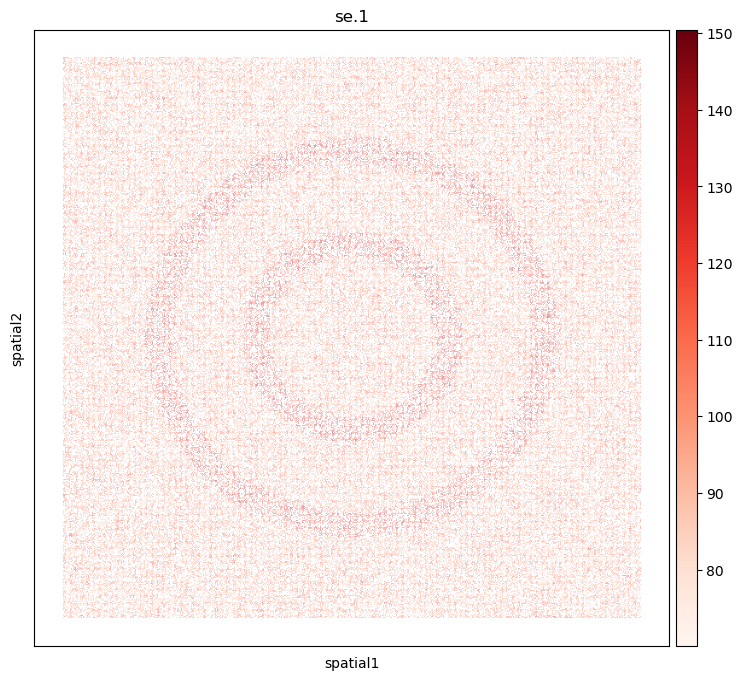

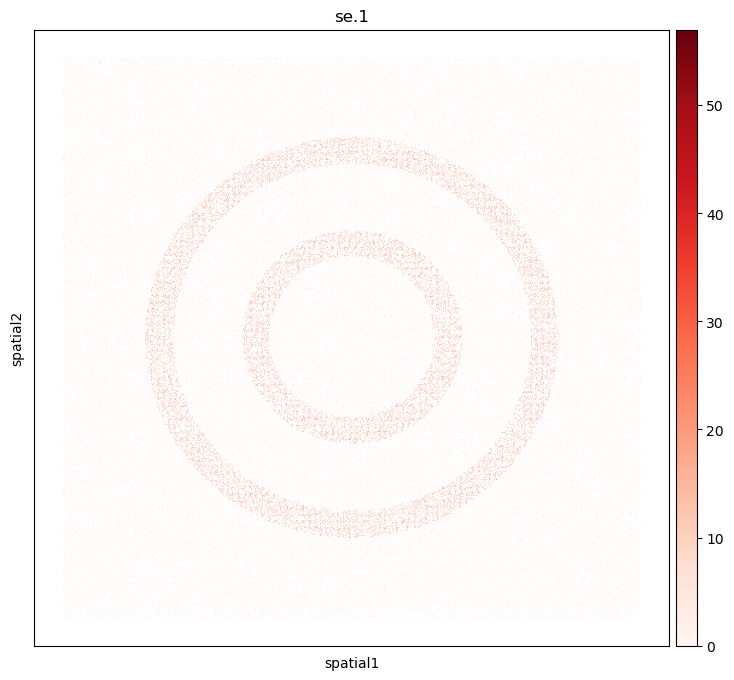

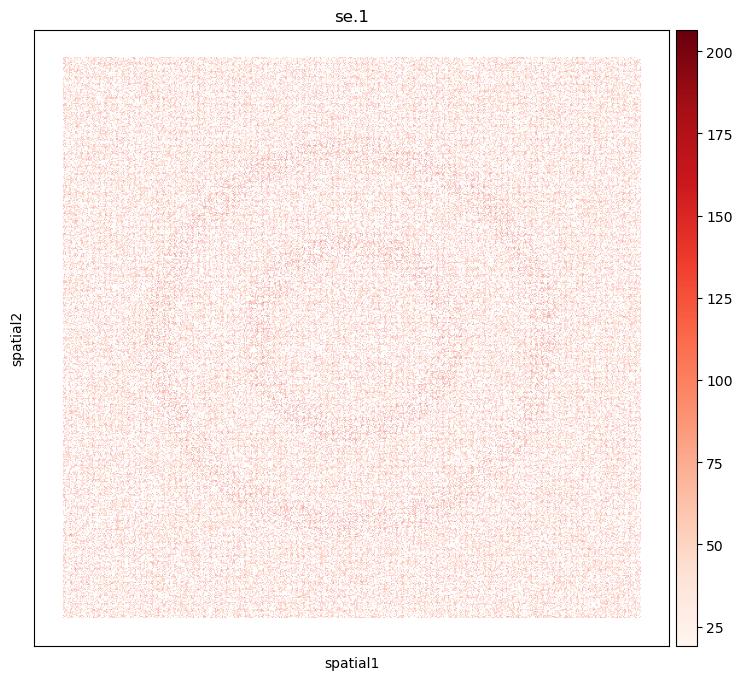

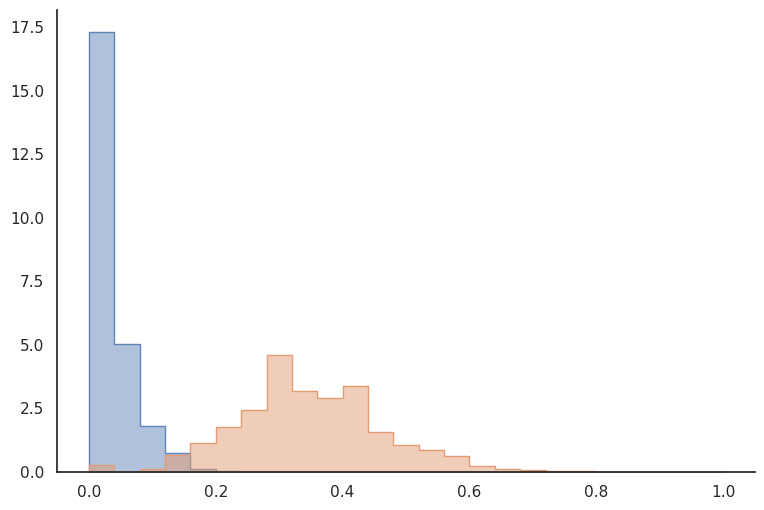

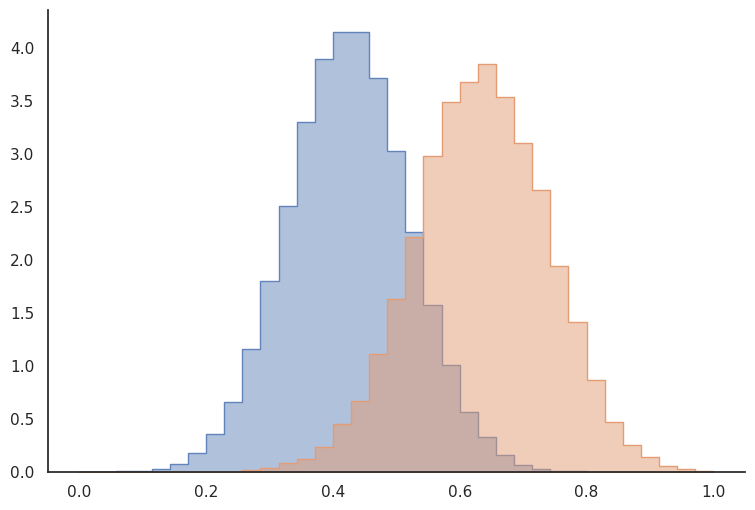

...

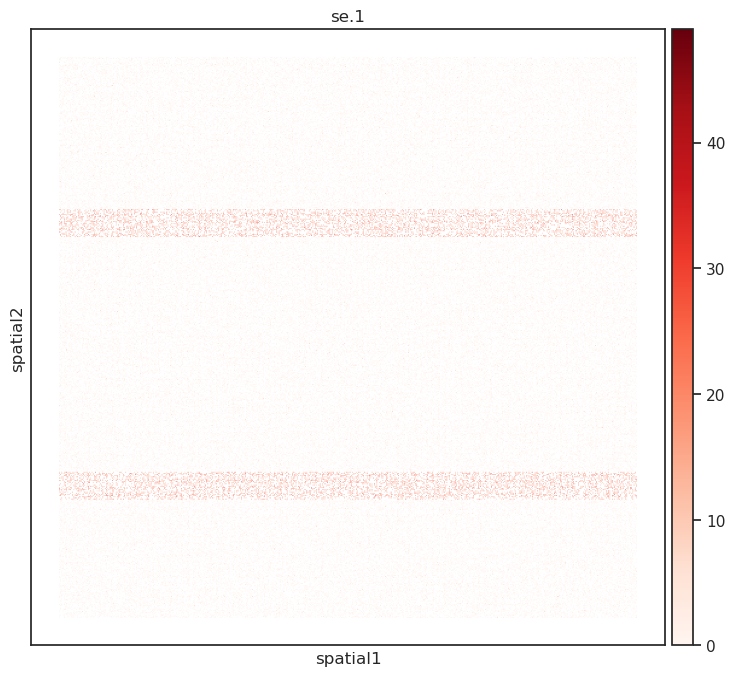

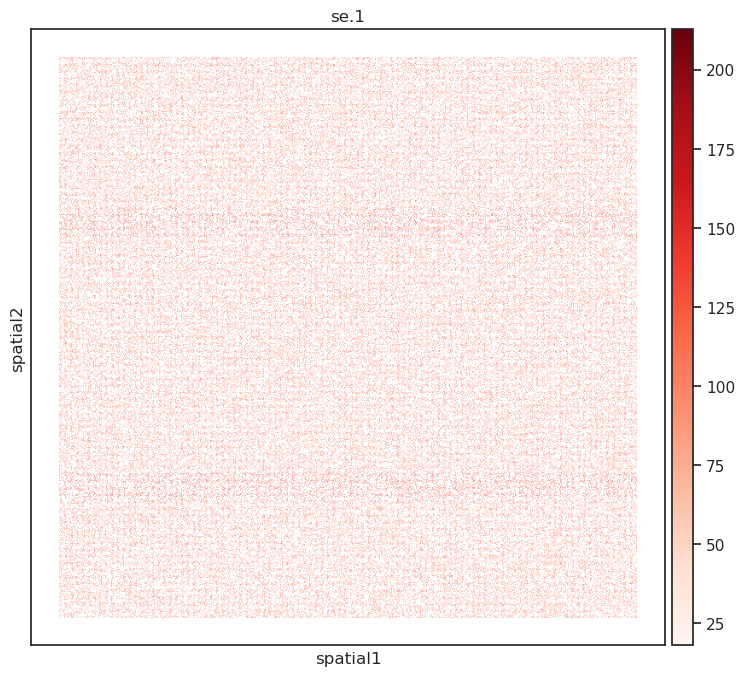

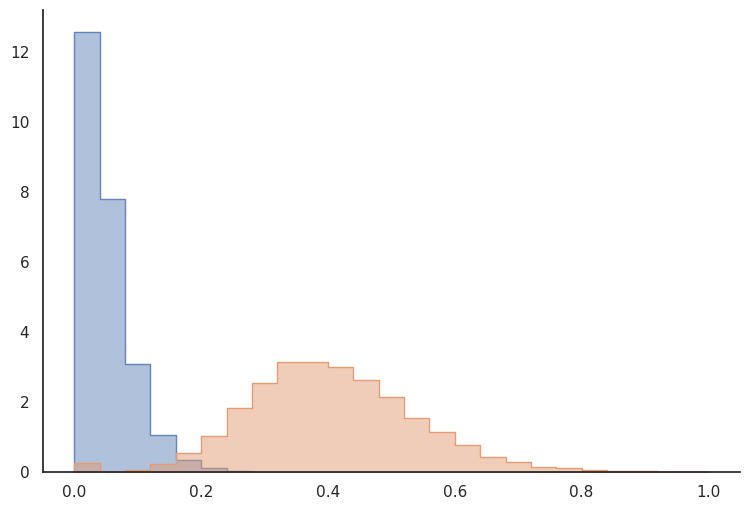

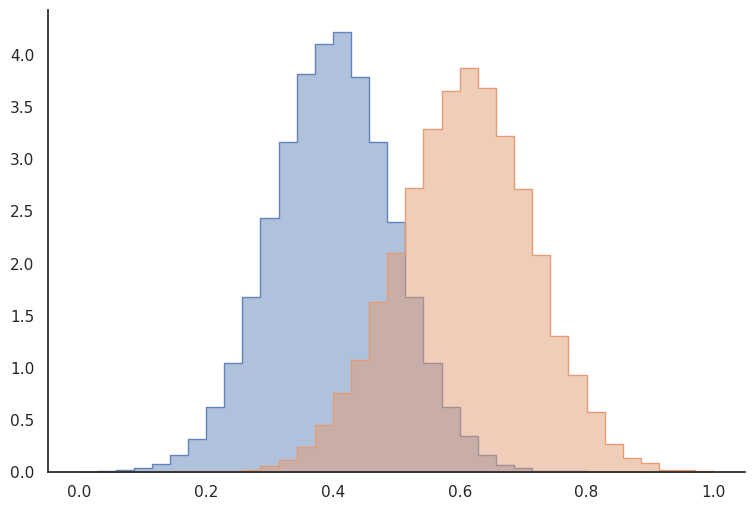

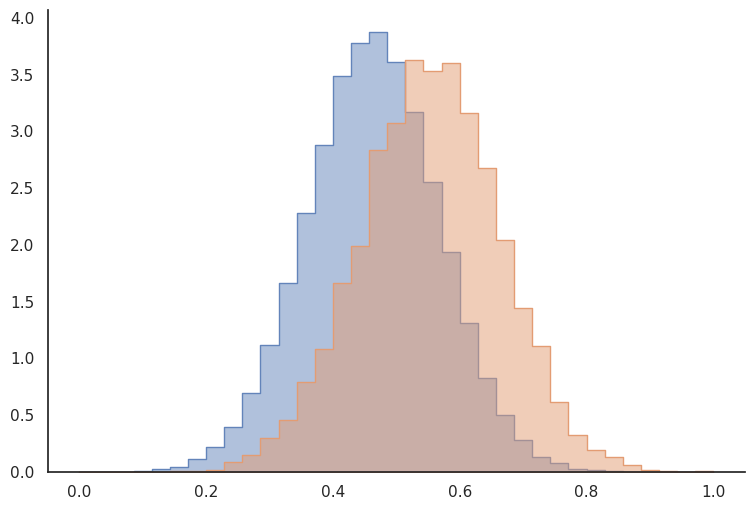

In [3]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['1']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X
        mean = 20  # noise mean
        stddev = 20  # noise std
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
        
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X
        mean = 15  
        stddev = 15 
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
    adata.layers['noise'] = adata.X
    
    adata.obsm['feat']=adata.X
    #KNN smooth model
    graph = prepare_inputs(adata, k=8, device=device)

    # ===== kNN smoothing baseline =====
    nbr = graph.neighbor_idx.detach().cpu().numpy()    
    X   = adata.X       
    knn_rex = X[nbr].mean(axis=1)                    
    adata.layers['rex'] = knn_rex
    
    #Evaluation
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['noise_norm'] = min_max_norm(adata.layers['noise'])
    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    noise_data = adata.layers['noise'][:, :50]

    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    noise_norm_data = adata.layers['noise_norm'][:, :50]
    
    # 2.  Reconstructed (Rex) vs Ground Truth
    rex_pcc, rex_spcc,pcc_per_gene, spcc_per_gene = compute_all_metrics(gt_data, rex_data)
    noise_pcc, noise_spcc,noise_pcc_per_gene,noise_spcc_per_gene = compute_all_metrics(gt_data, noise_data)
    rmse, mae, rmse_per_gene, mae_per_gene=error_metrics(gt_norm_data,rex_norm_data)
    noise_rmse, noise_mae, noise_rmse_per_gene, noise_mae_per_gene=error_metrics(gt_norm_data,noise_norm_data)
    
    print(f"\n{'Metric':<10} | {'Reconstructed (KNN smooth)':<22} | {'Noisy Input':<22}")
    print("-" * 60)
    print(f"{'PCC':<10} | {rex_pcc:.4f}{' (Higher is better)':<22} | {noise_pcc:.4f}")
    print(f"{'SPCC':<10} | {rex_spcc:.4f}{' (Higher is better)':<22} | {noise_spcc:.4f}")
    print(f"{'RMSE':<10} | {rmse:.4f}{' (Lower is better)':<22} | {noise_rmse:.4f}")
    print(f"{'MAE':<10} | {mae:.4f}{' (Lower is better)':<22} | {noise_mae:.4f}")
    
    
    rex_df = pd.DataFrame({"Methods": ["KNNsmooth"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": pcc_per_gene,"SPCC": spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir},)
    noise_df = pd.DataFrame({"Methods": ["Noise"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene,"SPCC": noise_spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir})
    
    rex_df.to_csv(f"{res_dir}/KNNsmooth_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/noise_vs_gt_correlation.csv", index=False)
    
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False)
    plt.savefig(f'{res_dir}/KNNsmooth_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False)
    plt.savefig(f'{res_dir}/KNNsmooth_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='noise',show=False)
    plt.savefig(f'{res_dir}/KNNsmooth_svg_sp_noise.png')

    plot_gene_dist(adata,0,num_bin=25,layer='gt_norm',save=f'{res_dir}/gt_svg_dist_gt.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='rex_norm',save=f'{res_dir}/KNNsmooth_svg_dist_rex.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='noise_norm',save=f'{res_dir}/Noise_svg_dist_noise.svg')